In [1]:
from sklearn.datasets import make_blobs

In [2]:
# !pip install plotly
import plotly.express as pe
import plotly

In [3]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
data, cluster = make_blobs(n_samples=50000, n_features=3,
                           centers=np.array([[2.0,-3.5,1.0],
                                            [4,2.5,-3.0],
                                            [1.0,1.0,-1.0]]),
                           random_state=1234)

In [5]:
# fig = pe.scatter_3d(x=data[:,0].flatten(), y=data[:,1].flatten(), z=data[:,2].flatten(), color=cluster)
# fig.update_traces(visible=True, selector=dict(type='scatter3d'))
# fig.show()

In [6]:
fig = pe.scatter_3d(x=data[:,0], y=data[:,1],z=data[:,2],color=cluster)

fig.update_traces(marker=dict(size=2,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.show()

In [8]:
km = KMeans(n_clusters=500)
km.fit(data)

KMeans(n_clusters=500)

In [9]:
km.cluster_centers_

array([[ 0.10349116,  1.30176487, -1.45390288],
       [ 2.23408444, -3.30906244,  0.82935833],
       [ 4.53923337,  3.11003015, -3.48803663],
       ...,
       [-0.40791817,  0.20883256, -1.55835448],
       [ 4.78733188,  2.8384807 , -1.67966309],
       [ 2.13724468, -2.81325588,  1.26673072]])

In [10]:
km.labels_

array([303,  55, 448, ...,  46, 385,  55])

In [11]:
data_hierarchy = km.cluster_centers_

In [12]:
Z = linkage(y=data_hierarchy,method='complete')

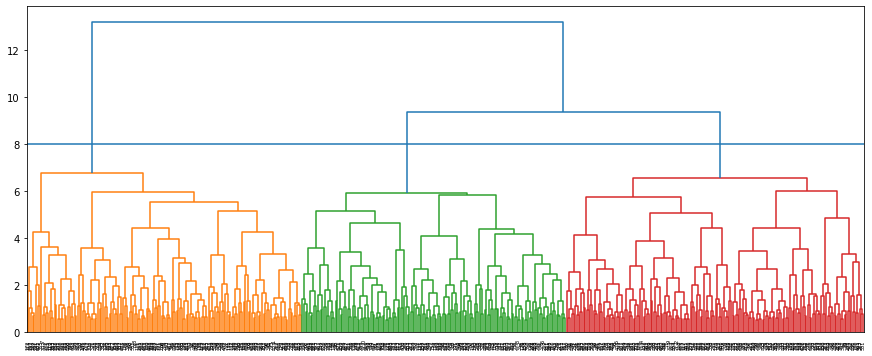

In [15]:
plt.figure(figsize=(15,6))
d = dendrogram(Z)
plt.axhline(y = 8)
plt.show()

Green and red cluster are not quite away from each other. Look at y axis value. Green cluster is going up by 3 units and red cluster is going up by 2 units. So difference is not large. But orange cluster is quite away from green and  red.

Here we will go for 3 cluster solution. Note these three clusters are cluster solution of 500 clusters centroid and not the actual data point.

In [16]:
h_clust = cut_tree(Z, height=8)

In [26]:
h_clust[:10]

array([[0],
       [1],
       [2],
       [0],
       [2],
       [2],
       [0],
       [1],
       [1],
       [2]])

In [27]:
data.shape, km.labels_.shape, data_hierarchy.shape, h_clust.shape

((50000, 3), (50000,), (500, 3), (500, 1))

In [21]:
data_df = pd.DataFrame(data, columns=['V1','V2','V3'])

In [22]:
data_df.head()

,V1,V2,V3
0,3.001791,1.459447,-2.817481
1,1.186886,0.818242,-2.744091
2,0.981428,-4.759490,1.239614
3,0.989724,-3.889284,-0.217607
4,2.012771,0.530639,-0.949729


In [28]:
data_df['km_clust'] = km.labels_

In [30]:
data_df.head(10)

,V1,V2,V3,km_clust
0,3.001791,1.459447,-2.817481,303
1,1.186886,0.818242,-2.744091,55
2,0.981428,-4.759490,1.239614,448
3,0.989724,-3.889284,-0.217607,285
4,2.012771,0.530639,-0.949729,251
5,-0.373146,-0.020729,-2.195394,149
6,3.515510,-2.071703,0.937766,218
7,3.569429,4.087968,-3.909762,267
8,-0.816322,2.692742,1.066664,271
9,5.052454,2.275371,-4.939783,216


In [53]:
data_df.groupby('km_clust').mean().head()

,V1,V2,V3
km_clust,,,
0,0.103491,1.301765,-1.453903
1,2.234273,-3.310043,0.827639
2,4.539233,3.110030,-3.488037
3,1.140846,1.636319,-1.052475
4,3.768493,2.432716,-0.924840


In [56]:
data_hierarchy[:5,:]  # First 5 row of this is matching with 1st five row of data_df.groupby('km_clust').mean()

array([[ 0.10349116,  1.30176487, -1.45390288],
       [ 2.23408444, -3.30906244,  0.82935833],
       [ 4.53923337,  3.11003015, -3.48803663],
       [ 1.1408462 ,  1.63631947, -1.05247503],
       [ 3.76849256,  2.43271563, -0.92484031]])

In [64]:
# hc_df = pd.DataFrame(data_hierarchy)
# hc_df['km_clust'] = hc_df.index
# hc_df['clust'] = h_clust 
# kk = pd.merge(data_df,hc_df,how='left',on='km_clust')
# print(kk.isnull().sum())
# kk.drop(columns=[0,1,2,'km_clust'], inplace=True)
# kk.head()

In [58]:
df = pd.DataFrame(np.c_[np.array(range(500)),h_clust],columns=['km_clust','h_clust'])

In [66]:
df.head()

,km_clust,h_clust
0,0,0
1,1,1
2,2,2
3,3,0
4,4,2


In [68]:
final_data = pd.merge(data_df,df,on='km_clust')
print(final_data.shape)
final_data.head(10)

(50000, 5)


,V1,V2,V3,km_clust,h_clust
0,3.001791,1.459447,-2.817481,303,2
1,2.651309,1.463474,-2.844843,303,2
2,3.200545,1.446243,-2.547456,303,2
3,2.778386,1.571139,-3.186696,303,2
4,3.116814,1.149616,-2.741968,303,2
5,2.444130,1.326084,-2.715624,303,2
6,2.847939,1.406429,-3.083143,303,2
7,2.740053,1.699653,-2.971507,303,2
8,2.800240,1.753818,-2.700964,303,2
9,3.117639,1.383515,-2.713088,303,2


In [73]:
fig1 = pe.scatter_3d(data_frame=final_data,x='V1',y='V2',z='V3',color='h_clust')

fig1.update_traces(marker=dict(size=2,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig1.show()

In [88]:
data.shape, final_data.shape

((50000, 3), (50000, 5))

In [104]:
data[:5,:]

array([[ 3.00179108,  1.45944694, -2.81748094],
       [ 1.18688615,  0.81824219, -2.74409131],
       [ 0.98142781, -4.75948969,  1.23961415],
       [ 0.98972385, -3.88928443, -0.21760692],
       [ 2.01277072,  0.53063927, -0.94972919]])

In [101]:
cluster

array([1, 2, 0, ..., 1, 1, 2])

In [109]:
 #0--->1 # 1--->2 # 2--->0

In [137]:
cluster2 = cluster.copy()

In [138]:
# a0 = cluster[cluster==0].copy()
# a1 = cluster[cluster==1].copy()
# a2 = cluster[cluster==2].copy()
# a0.shape,a1.shape,a2.shape

In [139]:
# a0 = a0 + 1
# a1 = a1 + 1
# a2 = a2*2
# a0.shape,a1.shape,a2.shape

In [140]:
cluster2[cluster2==0].shape, cluster2[cluster2==1].shape, cluster2[cluster2==2].shape

((16667,), (16667,), (16666,))

In [141]:
cluster2 = cluster2 + 1
cluster2
cluster2[cluster2==3]=0
cluster2

array([2, 0, 1, ..., 2, 2, 0])

In [142]:
cluster2[cluster2==0].shape, cluster2[cluster2==1].shape, cluster2[cluster2==2].shape

((16666,), (16667,), (16667,))

In [143]:
pd.crosstab(cluster2,final_data.h_clust)

h_clust,0,1,2
row_0,,,
0,5257,5491,5918
1,5324,5537,5806
2,5271,5561,5835
